# Библиотеки


In [ ]:
!pip install catboost
!pip install umap-learn
!pip install umap-learn[plot]

     |████████████████████████████████| 76.1 MB 47 kB/s 
     |████████████████████████████████| 86 kB 2.9 MB/s 
     |████████████████████████████████| 1.1 MB 37.6 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82708 sha256=a2e2d423737daeeb8d9b64f72f2598f7e3b6ea319dbbb045b700d7a370651014
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.6-py3-none-any.whl size=53943 sha256=deabdf70b1717be697c13a81f17ca38cc81f9748912bd7c5e83bb9379153b536
  Stored in directory: /root/.cache/pip/wheels/03/f1/56/f80d72741e400345b5a5b50ec3d929aca581bf45e0225d5c50
Successfully built umap-learn pynndescent
     |████████████████████████████████| 15.8 MB 4.4 MB/s 
     |████████████████████████████████| 76 kB 5.3 MB/s 
     |████████████████████████████████| 133 kB 50.0 MB/s 
     |████████████████████████████████| 830 kB 75.1 MB/s 
     |███████████████████

In [ ]:
!pip install pandas-profiling==3.1.0

In [ ]:
import numpy as np
from numpy import mean
from numpy import median
from numpy import std
import os
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import MultipleLocator
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import make_scorer
from sklearn.metrics import log_loss
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import HistGradientBoostingClassifier

import catboost
from catboost import CatBoostClassifier
import lightgbm as lgb
from lightgbm import LGBMClassifier

import umap
import umap.plot
from umap.parametric_umap import ParametricUMAP

sns.set()
sns.set_style('whitegrid')
sns.set_context(rc = {'lines.linewidth': 3})

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')


ModuleNotFoundError: ignored

#1. Загрузка данных

In [ ]:
from google.colab import files
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
train = pd.read_csv('gdrive/MyDrive/Otto_Group_Product_Classification/train.csv')
test = pd.read_csv('gdrive/MyDrive/Otto_Group_Product_Classification/test.csv')
sub = pd.read_csv('gdrive/MyDrive/Otto_Group_Product_Classification/sampleSubmission.csv')

NameError: ignored

In [ ]:
train.shape, test.shape

((61878, 95), (144368, 94))

# 2. Анализ данных

In [ ]:
train.head()

,id,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,feat_10,feat_11,feat_12,feat_13,feat_14,feat_15,feat_16,feat_17,feat_18,feat_19,feat_20,feat_21,feat_22,feat_23,feat_24,feat_25,feat_26,feat_27,feat_28,feat_29,feat_30,feat_31,feat_32,feat_33,feat_34,feat_35,feat_36,feat_37,feat_38,feat_39,...,feat_55,feat_56,feat_57,feat_58,feat_59,feat_60,feat_61,feat_62,feat_63,feat_64,feat_65,feat_66,feat_67,feat_68,feat_69,feat_70,feat_71,feat_72,feat_73,feat_74,feat_75,feat_76,feat_77,feat_78,feat_79,feat_80,feat_81,feat_82,feat_83,feat_84,feat_85,feat_86,feat_87,feat_88,feat_89,feat_90,feat_91,feat_92,feat_93,target
0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,2,0,0,0,0,1,0,4,1,1,0,0,2,0,0,0,0,0,1,0,0,0,0,...,0,0,2,0,0,11,0,1,1,0,1,0,7,0,0,0,1,0,0,0,0,0,0,0,2,1,0,0,0,0,1,0,0,0,0,0,0,0,0,Class_1
1,2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,2,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Class_1
2,3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,6,0,0,2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,Class_1
3,4,1,0,0,1,6,1,5,0,0,1,1,0,1,0,0,1,1,0,0,0,0,0,0,7,2,2,0,0,0,58,0,10,0,0,0,0,0,3,0,...,1,0,0,0,0,0,0,0,0,0,2,1,5,0,0,4,0,0,2,1,0,1,0,0,1,1,2,2,0,22,0,1,2,0,0,0,0,0,0,Class_1
4,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,3,0,0,0,0,0,0,0,4,0,1,0,0,0,1,0,0,0,0,1,0,0,0,Class_1


##Пропуски

In [ ]:
#проверим данные на пропуски
sum(train.isna().sum()), sum(test.isna().sum())

(5878410, 0)

Данные не содержат пропуски.

##Pandas profiling

In [ ]:
profile_final = ProfileReport(train, title='Otto Group products', explorative=True, minimal=True)
profile_final.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##Целевая переменная target

Text(0, 0.5, 'Количество')

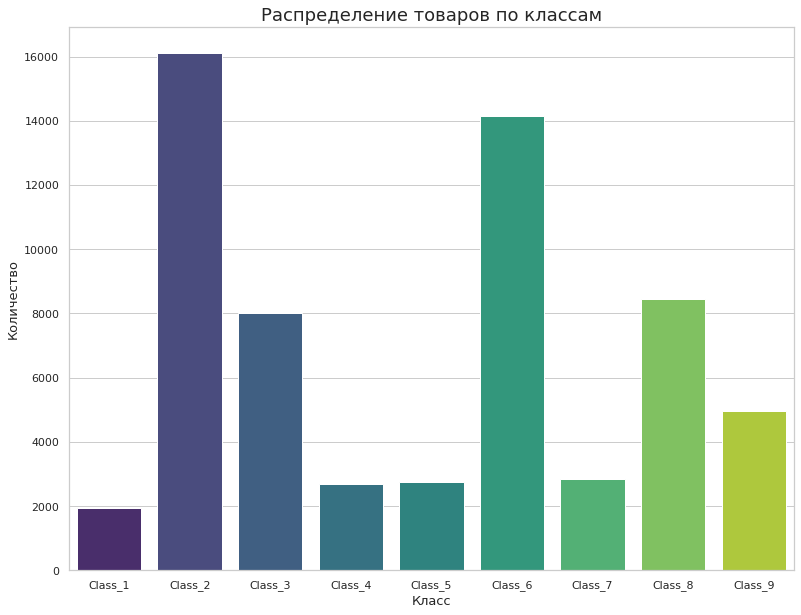

In [ ]:
fig, ax = plt.subplots(figsize=(13,10))
sns.countplot(train['target'], palette='viridis')
plt.title('Распределение товаров по классам', fontsize=18)
plt.xlabel('Класс', fontsize=13)
plt.ylabel('Количество', fontsize=13)

По графику видно, что классы несбалансированы, необходимо будет это учесть далее.

##Feat_1 - Feat_93


In [ ]:
train.describe()

,id,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,feat_10,feat_11,feat_12,feat_13,feat_14,feat_15,feat_16,feat_17,feat_18,feat_19,feat_20,feat_21,feat_22,feat_23,feat_24,feat_25,feat_26,feat_27,feat_28,feat_29,feat_30,feat_31,feat_32,feat_33,feat_34,feat_35,feat_36,feat_37,feat_38,feat_39,...,feat_54,feat_55,feat_56,feat_57,feat_58,feat_59,feat_60,feat_61,feat_62,feat_63,feat_64,feat_65,feat_66,feat_67,feat_68,feat_69,feat_70,feat_71,feat_72,feat_73,feat_74,feat_75,feat_76,feat_77,feat_78,feat_79,feat_80,feat_81,feat_82,feat_83,feat_84,feat_85,feat_86,feat_87,feat_88,feat_89,feat_90,feat_91,feat_92,feat_93
count,61878.000000,61878.00000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,...,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000
mean,30939.500000,0.38668,0.263066,0.901467,0.779081,0.071043,0.025696,0.193704,0.662433,1.011296,0.263906,1.252869,0.140874,0.480979,1.696693,1.284398,1.413459,0.366108,0.575423,0.551699,0.471525,0.204014,0.729969,0.142522,2.643880,1.534520,0.563108,0.696613,0.238970,0.275768,0.150312,0.148680,1.043796,0.696516,0.946411,0.666263,0.709089,0.263632,0.582129,0.485585,...,2.072465,0.323120,0.303775,0.309108,0.697970,0.388603,1.029930,0.239746,1.187563,0.168590,1.256796,0.222228,0.571706,2.897653,0.392902,0.811128,0.892789,0.319290,0.858722,0.591050,0.579851,0.726817,0.748457,0.124196,0.366415,0.300446,0.698067,0.078461,0.187983,0.496719,0.070752,0.532306,1.128576,0.393549,0.874915,0.457772,0.812421,0.264941,0.380119,0.126135
std,17862.784315,1.52533,1.252073,2.934818,2.788005,0.438902,0.215333,1.030102,2.255770,3.474822,1.083340,3.042333,0.567089,2.014697,3.163212,3.862236,2.226163,1.477436,1.335985,4.636145,1.438727,0.696050,1.446220,0.782979,4.629015,2.332994,1.710305,2.873222,0.828112,1.901294,1.640880,0.897354,2.416849,1.310202,3.368622,3.197965,2.555119,0.756934,1.602579,3.298315,...,4.113319,0.998743,1.925806,1.082148,3.983722,2.577693,3.028469,1.017553,2.666742,0.946158,3.402080,0.783052,1.361874,4.974322,1.761054,4.111091,1.941368,1.162443,2.411646,5.783233,3.757822,3.200095,2.920038,0.906621,2.778317,1.285569,2.245671,0.461244,0.836269,2.434921,1.151460,1.900438,2.681554,1.575455,2.115466,1.527385,4.597804,2.045646,0.982385,1.201720
min,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15470.250000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000

In [ ]:
#посчитаем корреляцию признаков
corrmat = train.drop(columns='id').corr()

In [ ]:
plt.figure(figsize=(80,80))
sns.heatmap(corrmat, annot=True, cmap='viridis')
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
#Выберем верхний треугольник корреляционной матрицы
upper = corrmat.abs().where(np.triu(np.ones(corrmat.abs().shape), k=1).astype(np.bool))

#Найдем признаки с корреляцией больше 0.8
to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]
to_drop

['feat_45']

Из 93 признаков только 2 имеют корреляцию друг с другом более 0.8 Это признаки feat_45 и feat_39.

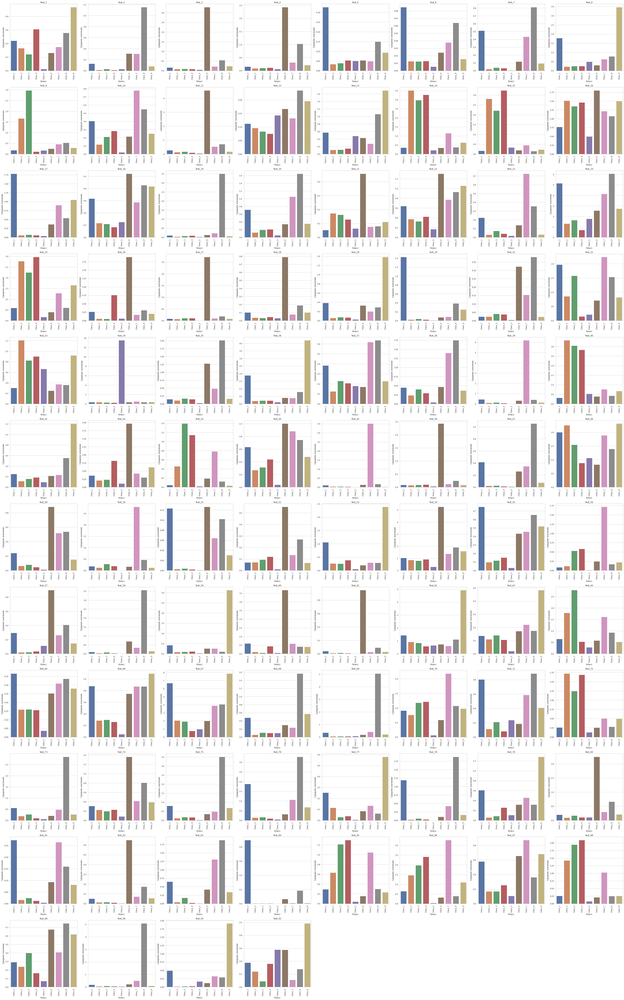

In [ ]:
#построим распределение среднего значения признаков по классам
features = [col for col in train.columns[1:93]]
fig, axes = plt.subplots(figsize=(50,80))
for i in range(len(features)):
    col = features[i]
    plt.subplot(12, 8, i+1)
    sns.barplot(x=train['target'], y=train[col], ci=None)
    plt.xticks(rotation='90')
    plt.title(col)
    plt.xlabel('Класс')
    plt.ylabel('Среднее значение')
plt.tight_layout()
plt.show()

По графикам видно, что есть признаки, которые больше характеризуют какой-то конкретный класс (feat_82, feat_84, feat_90), также есть признаки, которые характеризуют все классы одновременно (feaf_12, feaf_16, feaf_48).

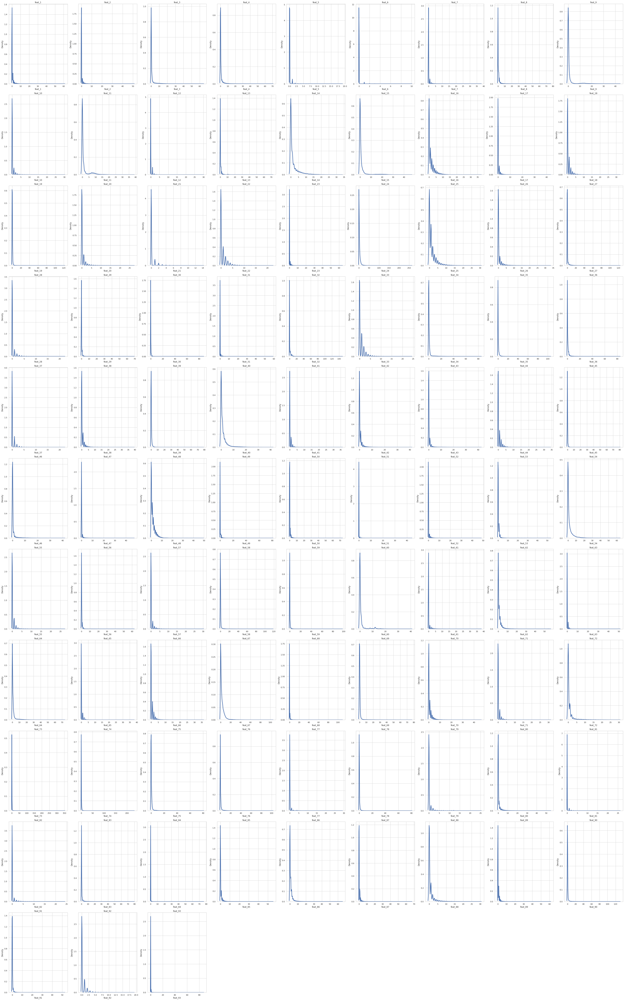

In [ ]:
#построим распределение значений признаков
features = [col for col in train.columns[1:94]]
fig, axes = plt.subplots(figsize=(50,80))
for i in range(len(features)):
    col = features[i]
    plt.subplot(11, 9, i+1)
    sns.kdeplot(train[col])
    plt.title(col)
    #plt.xlabel('Класс')
    #plt.ylabel(col)
    #plt.ylim(0)
plt.tight_layout()
plt.show()

По графикам видно, что все признаки имеют смещенное распределение.

#3. Подготовка данных

In [ ]:
X = train.drop(columns=['target', 'id'])
y = train['target']
test = test.drop(columns=['id'])

##Label Encoder

In [ ]:
lb = preprocessing.LabelEncoder()
y = lb.fit_transform(y)

##Нормализация признаков

In [ ]:
pt = PowerTransformer()
X_pt = pt.fit_transform(X)
X_pt = pd.DataFrame(X_pt, columns=X.columns)

test_pt = pt.fit_transform(test)
test_pt = pd.DataFrame(test_pt, columns=test.columns)

##Разделение выборки на тренировочную и тестовую часть

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_pt, y, train_size=0.8, random_state=9, stratify=y)

In [ ]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((49502, 93), (12376, 93), (49502,), (12376,))

#4. Models

##Catboost

In [ ]:
cb_clf =  CatBoostClassifier(auto_class_weights = 'Balanced',
                              random_state=9)

cb_clf.fit(X_train, y_train, verbose=True)

y_pred = cb_clf.predict_proba(X_test)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo')
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

Learning rate set to 0.096549
0:	learn: 2.0343953	total: 262ms	remaining: 4m 21s
1:	learn: 1.9282942	total: 455ms	remaining: 3m 46s
2:	learn: 1.8561498	total: 694ms	remaining: 3m 50s
3:	learn: 1.7718626	total: 911ms	remaining: 3m 46s
4:	learn: 1.7135193	total: 1.26s	remaining: 4m 10s
5:	learn: 1.6639295	total: 1.67s	remaining: 4m 37s
6:	learn: 1.6151440	total: 2.16s	remaining: 5m 5s
7:	learn: 1.5747443	total: 2.62s	remaining: 5m 24s
8:	learn: 1.5434872	total: 2.82s	remaining: 5m 10s
9:	learn: 1.5030365	total: 3.08s	remaining: 5m 5s
10:	learn: 1.4665653	total: 3.33s	remaining: 4m 59s
11:	learn: 1.4298103	total: 3.57s	remaining: 4m 53s
12:	learn: 1.3993167	total: 3.84s	remaining: 4m 51s
13:	learn: 1.3715998	total: 4.08s	remaining: 4m 47s
14:	learn: 1.3494088	total: 4.31s	remaining: 4m 42s
15:	learn: 1.3240408	total: 4.57s	remaining: 4m 40s
16:	learn: 1.3026712	total: 4.81s	remaining: 4m 38s
17:	learn: 1.2821646	total: 5.03s	remaining: 4m 34s
18:	learn: 1.2663422	total: 5.22s	remaining: 4

In [ ]:
y_pred1 = cb_clf.predict(X_test)
print(f1_score(y_test, y_pred1, average='weighted'))

0.793453433016011


In [ ]:
classes = ['Class_1', 'Class_2', 'Class_3', 'Class_4', 'Class_5', 'Class_6', 'Class_7', 'Class_8', 'Class_9']

Text(0.5, 1.0, 'Confusion matrix Catboost')

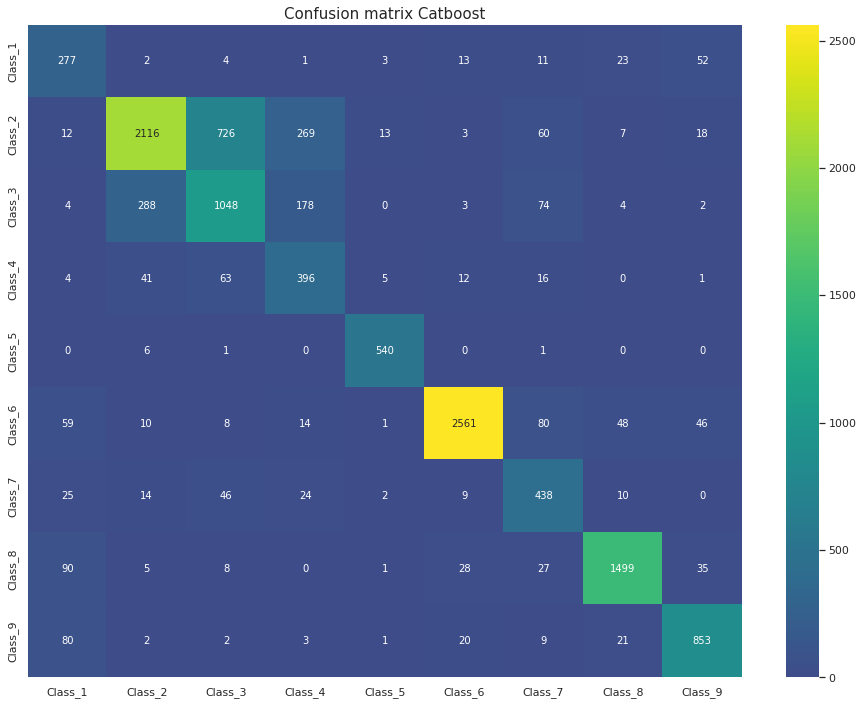

In [ ]:
confusion_matrix(y_test, y_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8])

plt.figure(figsize=(16,12))
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=classes, yticklabels=classes, center= 900)
plt.title('Confusion matrix Catboost', fontsize=15)

##Lightgbm

In [ ]:
lg_clf = LGBMClassifier(objective = 'multiclass',
                        class_weight = 'balanced',
                        random_state=9)

lg_clf.fit(X_train, y_train, verbose=True)

y_pred = lg_clf.predict_proba(X_test)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo')
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

log_loss=0.5914741146264796 roc_auc_score=0.9721819384690309 


In [ ]:
y_pred1 = lg_clf.predict(X_test)
print(f1_score(y_test, y_pred1, average='weighted'))

0.7845797244406363


Text(0.5, 1.0, 'Confusion matrix LightGBM')

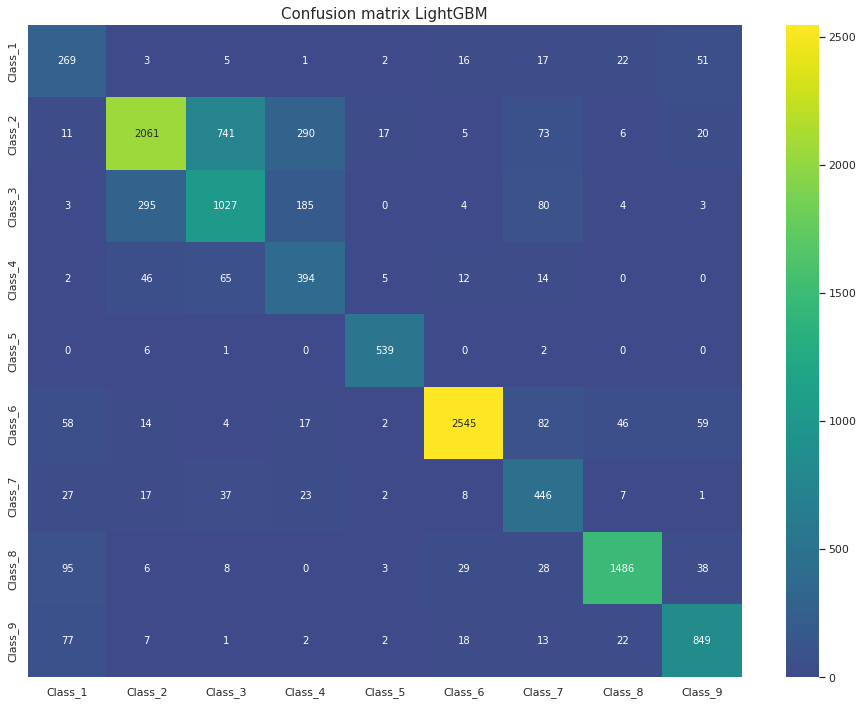

In [ ]:
confusion_matrix(y_test, y_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8])

plt.figure(figsize=(16,12))
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=classes, yticklabels=classes, center= 900)
plt.title('Confusion matrix LightGBM', fontsize=15)

##Random Forest

In [ ]:
rf_clf = RandomForestClassifier(class_weight = 'balanced',
                                random_state=9)

rf_clf.fit(X_train, y_train)

y_pred = rf_clf.predict_proba(X_test)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo')
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

log_loss=0.610806790844546 roc_auc_score=0.9723285602600139 


In [ ]:
y_pred1 = rf_clf.predict(X_test)
print(f1_score(y_test, y_pred1, average='weighted'))

0.8016634378304429


Text(0.5, 1.0, 'Confusion matrix LightGBM')

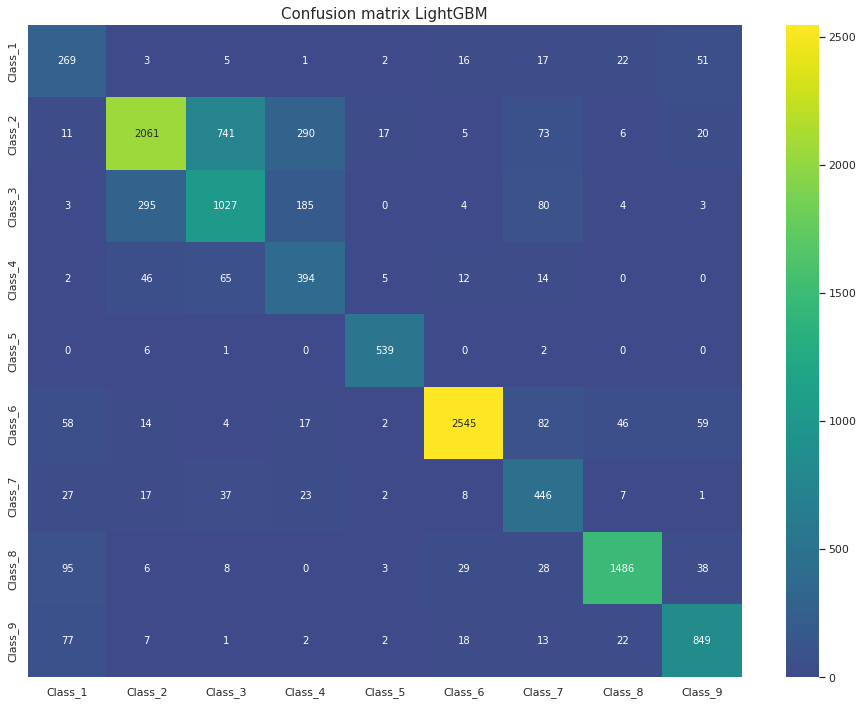

In [ ]:
confusion_matrix(y_test, y_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8])

plt.figure(figsize=(16,12))
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=classes, yticklabels=classes, center= 900)
plt.title('Confusion matrix LightGBM', fontsize=15)

##HistGradientBoostingClassifier

In [ ]:
model = HistGradientBoostingClassifier(loss = 'categorical_crossentropy', verbose=1)
model.fit(X_train, y_train)

y_pred = model.predict_proba(X_test)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo')
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

y_pred1 = model.predict(X_test)
print(f1_score(y_test, y_pred1, average='weighted'))

Binning 0.033 GB of training data: 0.745 s
Binning 0.004 GB of validation data: 0.062 s
Fitting gradient boosted rounds:
[1/100] 9 trees, 279 leaves (31 on avg), max depth = 13, train loss: 1.54459, val loss: 1.55732, in 0.811s
[2/100] 9 trees, 279 leaves (31 on avg), max depth = 12, train loss: 1.35769, val loss: 1.37815, in 0.948s
[3/100] 9 trees, 279 leaves (31 on avg), max depth = 15, train loss: 1.22176, val loss: 1.24668, in 0.765s
[4/100] 9 trees, 279 leaves (31 on avg), max depth = 13, train loss: 1.11764, val loss: 1.14618, in 1.113s
[5/100] 9 trees, 279 leaves (31 on avg), max depth = 14, train loss: 1.03196, val loss: 1.06332, in 0.936s
[6/100] 9 trees, 279 leaves (31 on avg), max depth = 14, train loss: 0.96235, val loss: 0.99654, in 1.024s
[7/100] 9 trees, 279 leaves (31 on avg), max depth = 13, train loss: 0.90453, val loss: 0.94090, in 1.034s
[8/100] 9 trees, 279 leaves (31 on avg), max depth = 23, train loss: 0.85527, val loss: 0.89523, in 0.987s
[9/100] 9 trees, 279 le

Text(0.5, 1.0, 'Confusion matrix LightGBM')

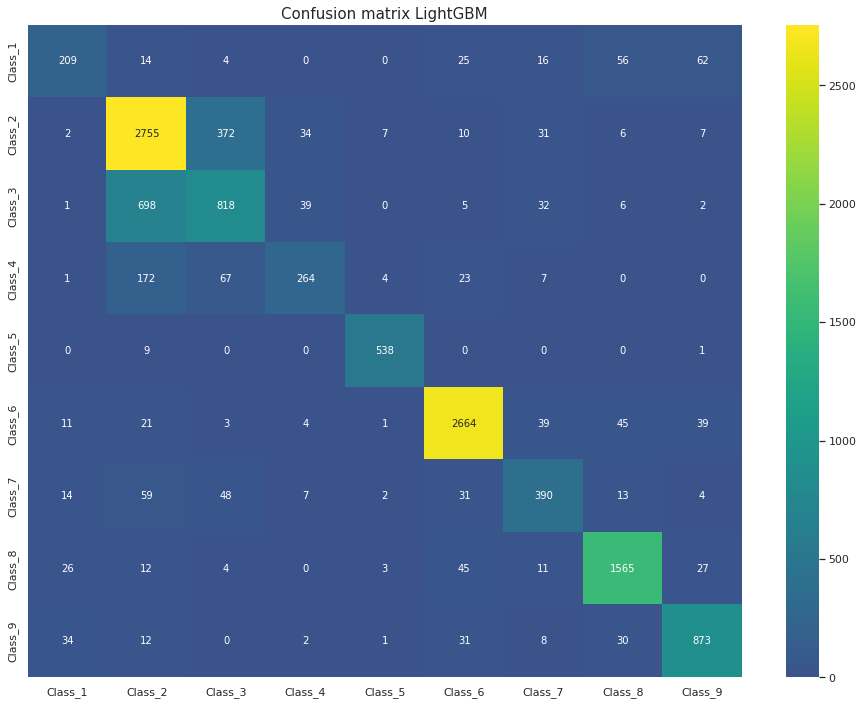

In [ ]:
confusion_matrix(y_test, y_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8])

plt.figure(figsize=(16,12))
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=classes, yticklabels=classes, center= 900)
plt.title('Confusion matrix LightGBM', fontsize=15)

#Feature importance

Посмотрим на важные признаки на основании модели Random Forest.

In [ ]:
feature_importance_rf = pd.DataFrame(rf_clf.feature_importances_, X_train.columns)

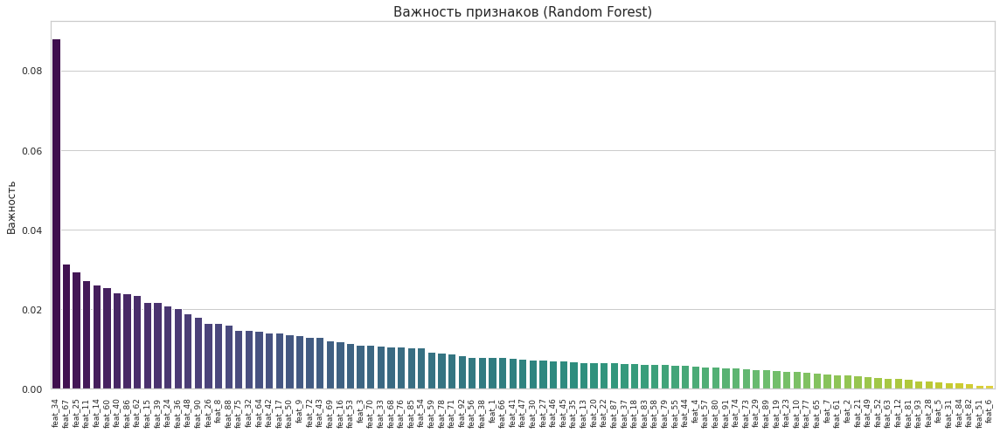

In [ ]:
fig, ax = plt.subplots(figsize=(16,7))
sns.barplot(feature_importance_rf.sort_values(by=0, ascending=False).index, feature_importance_rf[0].sort_values(ascending=False), palette='viridis')
plt.title('Важность признаков (Random Forest)', fontsize=15)
plt.ylabel('Важность')
plt.xticks(rotation='90', fontsize=9)
fig.tight_layout()

#5. Feature engineering

Сгенерим новые признаки.

In [ ]:
X_new = X.copy()
test_new = test.copy()

In [ ]:
X_new['mean'] = X.mean(axis=1)
test_new['mean'] = test.mean(axis=1)
X_new['var'] = X.var(axis=1)
test_new['var'] = test.var(axis=1)
X_new['sum'] = X.sum(axis=1)
test_new['sum'] = test.sum(axis=1)
X_new['non_zeros'] = X[X != 0].count(axis=1)
test_new['non_zeros'] = test[test != 0].count(axis=1)
X_new['max'] = X.max(axis=1)
test_new['max'] = test.max(axis=1)

In [ ]:
#X_new['max_diff'] = X_new['max'].max() - X_new['max']
#test_new['max_diff'] = test_new['max'].max() - test_new['max']

In [ ]:
pt = PowerTransformer()
X_pt_new = pt.fit_transform(X_new)
X_pt_new = pd.DataFrame(X_pt_new, columns=X_new.columns)

test_pt_new = pt.fit_transform(test_new)
test_pt_new = pd.DataFrame(test_pt_new, columns=test_new.columns)

X_train, X_test, y_train, y_test = train_test_split(X_pt_new, y, train_size=0.8, random_state=9, stratify=y)

#Модели с новыми признаками

##Catboost

In [ ]:
cb_clf =  CatBoostClassifier(auto_class_weights = 'SqrtBalanced',
                              random_state=9)

cb_clf.fit(X_train, y_train, verbose=True)

y_pred = cb_clf.predict_proba(X_test)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo')
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

Learning rate set to 0.096549
0:	learn: 2.0010332	total: 252ms	remaining: 4m 11s
1:	learn: 1.8808075	total: 496ms	remaining: 4m 7s
2:	learn: 1.7853035	total: 711ms	remaining: 3m 56s
3:	learn: 1.7155504	total: 954ms	remaining: 3m 57s
4:	learn: 1.6487083	total: 1.23s	remaining: 4m 4s
5:	learn: 1.5957809	total: 1.43s	remaining: 3m 56s
6:	learn: 1.5452823	total: 1.67s	remaining: 3m 56s
7:	learn: 1.5042271	total: 1.91s	remaining: 3m 57s
8:	learn: 1.4603263	total: 2.18s	remaining: 3m 59s
9:	learn: 1.4296901	total: 2.39s	remaining: 3m 56s
10:	learn: 1.3988116	total: 2.66s	remaining: 3m 59s
11:	learn: 1.3724992	total: 2.89s	remaining: 3m 57s
12:	learn: 1.3411711	total: 3.09s	remaining: 3m 54s
13:	learn: 1.3150204	total: 3.34s	remaining: 3m 55s
14:	learn: 1.2949741	total: 3.52s	remaining: 3m 51s
15:	learn: 1.2704360	total: 3.77s	remaining: 3m 52s
16:	learn: 1.2495498	total: 3.97s	remaining: 3m 49s
17:	learn: 1.2268246	total: 4.27s	remaining: 3m 52s
18:	learn: 1.2031200	total: 4.56s	remaining: 3

Добавление новых признаков немного улучшила модель.

In [ ]:
#поэкспериментируем с настройкой параметров
cb_clf =  CatBoostClassifier(auto_class_weights = 'SqrtBalanced',
                             n_estimators = 1800,
                             depth = 8,
                             random_state=9)

cb_clf.fit(X_train, y_train, verbose=True)

y_pred = cb_clf.predict_proba(X_test)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo')
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

Learning rate set to 0.058755
0:	learn: 2.0653373	total: 562ms	remaining: 16m 51s
1:	learn: 1.9661337	total: 1.1s	remaining: 16m 32s
2:	learn: 1.8866260	total: 1.66s	remaining: 16m 31s
3:	learn: 1.8206491	total: 2.21s	remaining: 16m 30s
4:	learn: 1.7607077	total: 2.77s	remaining: 16m 34s
5:	learn: 1.7097750	total: 3.32s	remaining: 16m 32s
6:	learn: 1.6683127	total: 3.85s	remaining: 16m 27s
7:	learn: 1.6257622	total: 4.39s	remaining: 16m 22s
8:	learn: 1.5830542	total: 4.93s	remaining: 16m 20s
9:	learn: 1.5477745	total: 5.46s	remaining: 16m 17s
10:	learn: 1.5125054	total: 5.99s	remaining: 16m 13s
11:	learn: 1.4805290	total: 6.51s	remaining: 16m 10s
12:	learn: 1.4537676	total: 7.06s	remaining: 16m 10s
13:	learn: 1.4247120	total: 7.57s	remaining: 16m 5s
14:	learn: 1.3944602	total: 8.09s	remaining: 16m 2s
15:	learn: 1.3729972	total: 8.62s	remaining: 16m 1s
16:	learn: 1.3473473	total: 9.15s	remaining: 15m 59s
17:	learn: 1.3255792	total: 9.68s	remaining: 15m 58s
18:	learn: 1.3066227	total: 10

In [ ]:
y_pred1 = cb_clf.predict(X_test)
print(f1_score(y_test, y_pred1, average='weighted'))

0.8213292986300176


Text(0.5, 1.0, 'Confusion matrix Catboost')

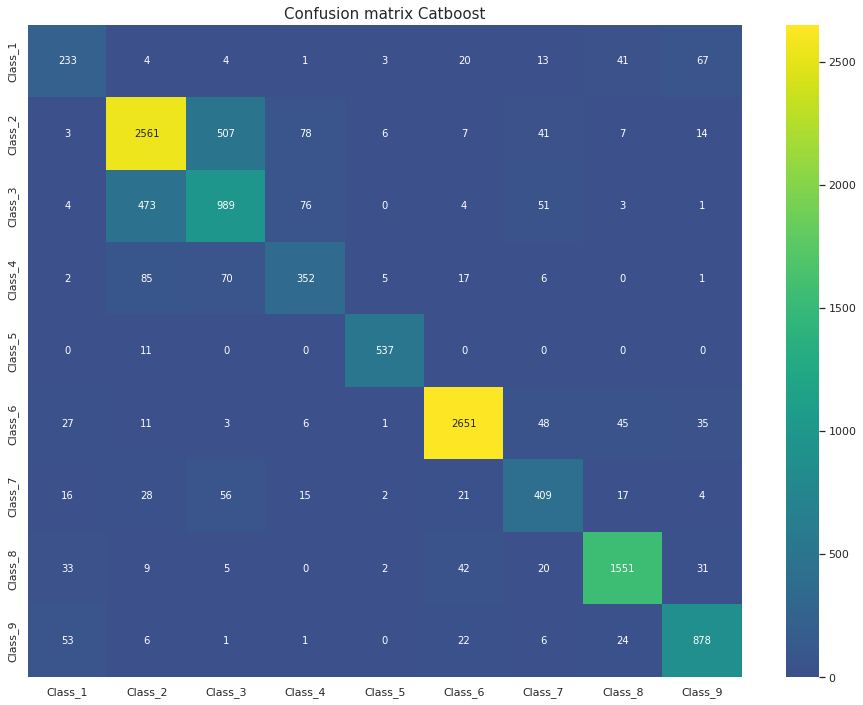

In [ ]:
confusion_matrix(y_test, y_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8])

plt.figure(figsize=(16,12))
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=classes, yticklabels=classes, center= 900)
plt.title('Confusion matrix Catboost', fontsize=15)

##LightGBM

In [ ]:
lg_clf = LGBMClassifier(objective = 'multiclass',
                        class_weight = 'balanced',
                        n_estimators = 1000,
                        random_state=9)

lg_clf.fit(X_train, y_train, verbose=True)

y_pred = lg_clf.predict_proba(X_test)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo')
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

log_loss=0.5059234535906012 roc_auc_score=0.9764924605305102 


In [ ]:
y_pred1 = lg_clf.predict(X_test)
print(f1_score(y_test, y_pred1, average='weighted'))

0.8203911169366724


Text(0.5, 1.0, 'Confusion matrix LightGBM')

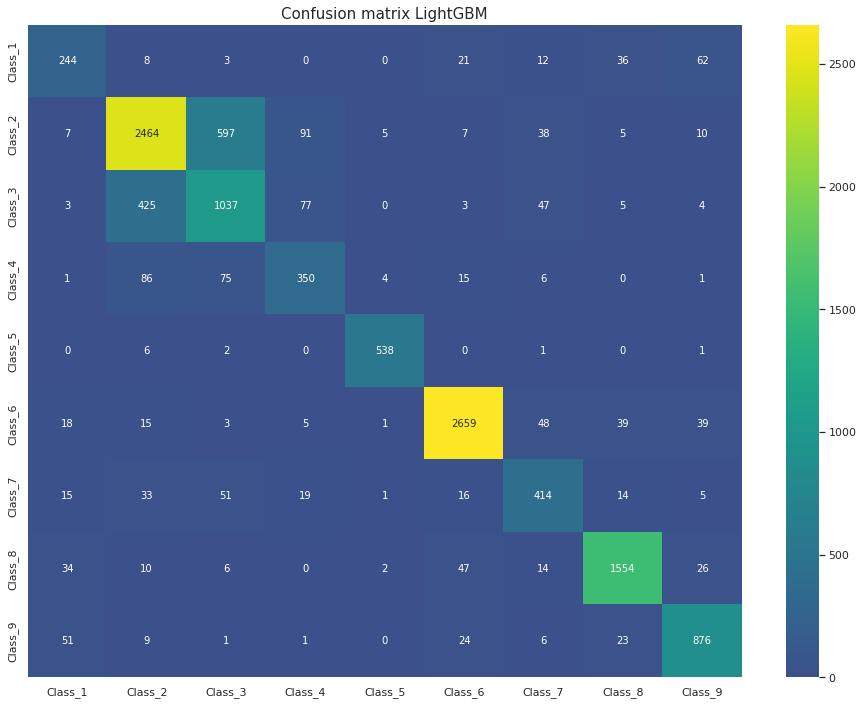

In [ ]:
confusion_matrix(y_test, y_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8])

plt.figure(figsize=(16,12))
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=classes, yticklabels=classes, center= 900)
plt.title('Confusion matrix LightGBM', fontsize=15)

##Random Forest

In [ ]:
rf_clf = RandomForestClassifier(class_weight = 'balanced',
                                n_estimators = 1000,
                                random_state=9)

rf_clf.fit(X_train, y_train)

y_pred = rf_clf.predict_proba(X_test)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo')
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

log_loss=0.5809864747581697 roc_auc_score=0.9745489977065227 


In [ ]:
y_pred1 = rf_clf.predict(X_test)
print(f1_score(y_test, y_pred1, average='weighted'))

0.8009640973129735


Text(0.5, 1.0, 'Confusion matrix LightGBM')

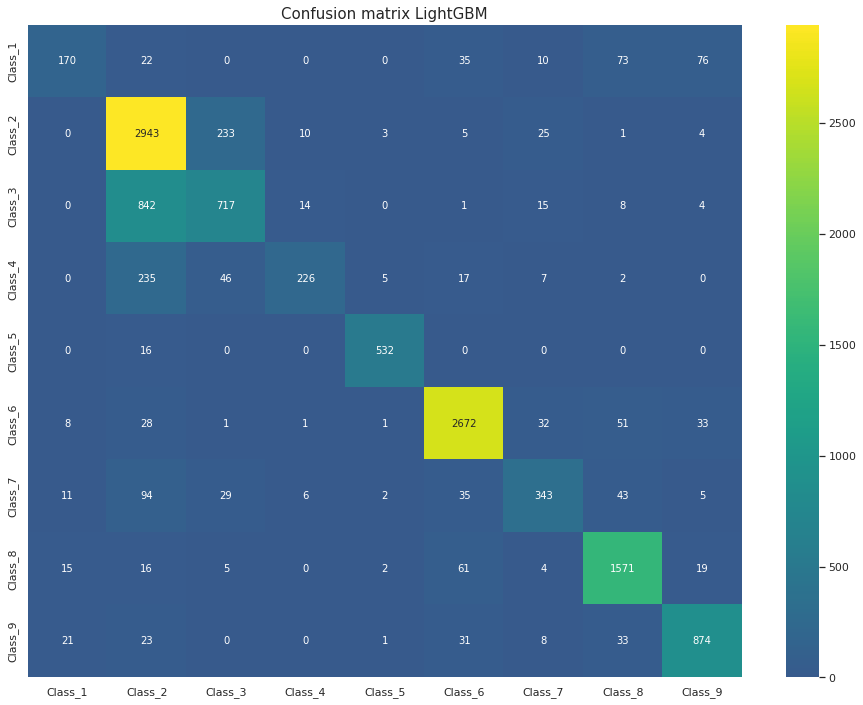

In [ ]:
confusion_matrix(y_test, y_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8])

plt.figure(figsize=(16,12))
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=classes, yticklabels=classes, center= 900)
plt.title('Confusion matrix LightGBM', fontsize=15)

##HistGradientBoostingClassifier

In [ ]:
model = HistGradientBoostingClassifier(loss = 'categorical_crossentropy', max_iter=1000, learning_rate=0.03, verbose=1, l2_regularization=3)
model.fit(X_train, y_train)

y_pred = model.predict_proba(X_test)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo')
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

y_pred1 = model.predict(X_test)
print(f1_score(y_test, y_pred1, average='weighted'))

Binning 0.036 GB of training data: 0.887 s
Binning 0.004 GB of validation data: 0.025 s
Fitting gradient boosted rounds:
[1/1000] 9 trees, 279 leaves (31 on avg), max depth = 11, train loss: 1.82904, val loss: 1.83220, in 1.147s
[2/1000] 9 trees, 275 leaves (30 on avg), max depth = 11, train loss: 1.73449, val loss: 1.74079, in 2.408s
[3/1000] 9 trees, 278 leaves (30 on avg), max depth = 11, train loss: 1.65397, val loss: 1.66259, in 1.299s
[4/1000] 9 trees, 277 leaves (30 on avg), max depth = 11, train loss: 1.58385, val loss: 1.59491, in 1.036s
[5/1000] 9 trees, 278 leaves (30 on avg), max depth = 11, train loss: 1.52101, val loss: 1.53438, in 1.141s
[6/1000] 9 trees, 276 leaves (30 on avg), max depth = 12, train loss: 1.46455, val loss: 1.48036, in 1.069s
[7/1000] 9 trees, 277 leaves (30 on avg), max depth = 12, train loss: 1.41320, val loss: 1.43006, in 1.176s
[8/1000] 9 trees, 278 leaves (30 on avg), max depth = 10, train loss: 1.36568, val loss: 1.38402, in 1.109s
[9/1000] 9 tree

Text(0.5, 1.0, 'Confusion matrix LightGBM')

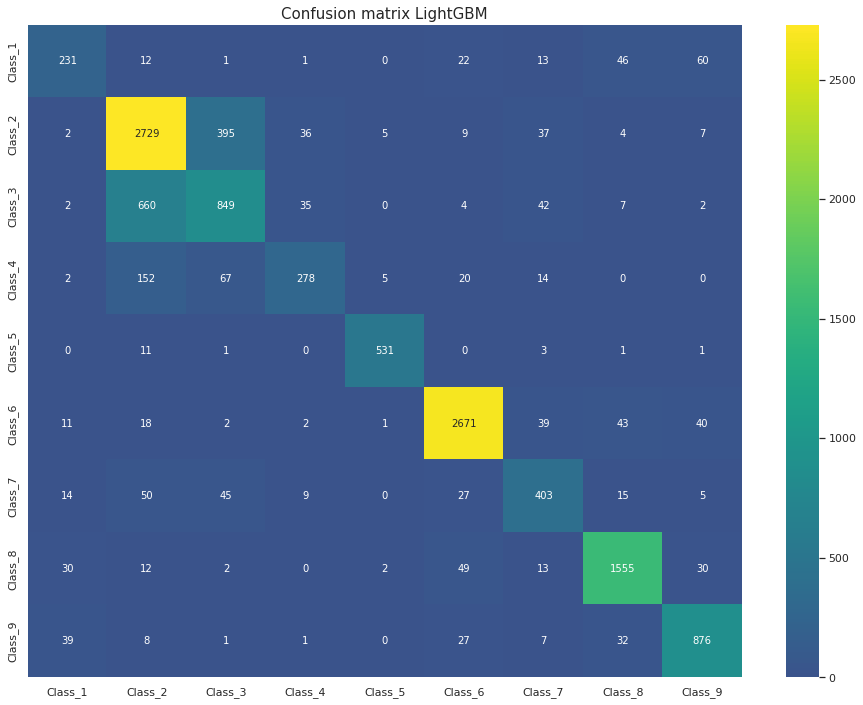

In [ ]:
confusion_matrix(y_test, y_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8])

plt.figure(figsize=(16,12))
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=classes, yticklabels=classes, center= 900)
plt.title('Confusion matrix LightGBM', fontsize=15)

#UMAP

In [ ]:
%%time
embedder = ParametricUMAP()
embedding = embedder.fit_transform(X_train, y_train)

Epoch 1/10
7581/7581 [==============================] - 147s 19ms/step - loss: 0.1729
Epoch 2/10
7581/7581 [==============================] - 144s 19ms/step - loss: 0.1450
Epoch 3/10
7581/7581 [==============================] - 147s 19ms/step - loss: 0.1384
Epoch 4/10
7581/7581 [==============================] - 145s 19ms/step - loss: 0.1353
Epoch 5/10
7581/7581 [==============================] - 145s 19ms/step - loss: 0.1330
Epoch 6/10
7581/7581 [==============================] - 146s 19ms/step - loss: 0.1317
Epoch 7/10
7581/7581 [==============================] - 145s 19ms/step - loss: 0.1303
Epoch 8/10
7581/7581 [==============================] - 147s 19ms/step - loss: 0.1292
Epoch 9/10
7581/7581 [==============================] - 145s 19ms/step - loss: 0.1285
Epoch 10/10
7581/7581 [==============================] - 145s 19ms/step - loss: 0.1276
CPU times: user 39min 9s, sys: 1min 59s, total: 41min 9s
Wall time: 25min 33s


Text(0.5, 1.0, 'X_train')

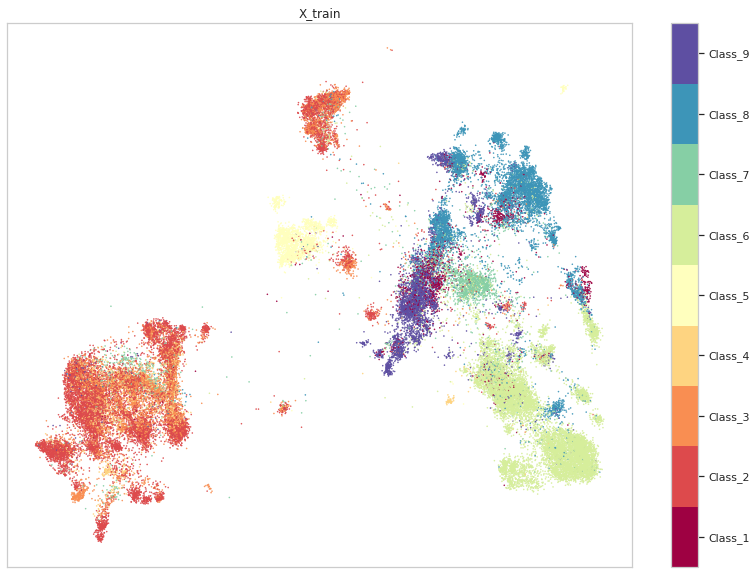

In [ ]:
fig, ax = plt.subplots(1, figsize=(14, 10))
plt.scatter(*embedding.T, s=0.3, c=y_train, cmap='Spectral', alpha=1.0)
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(10)-0.5)
cbar.set_ticks(np.arange(9))
cbar.set_ticklabels(classes)
plt.title('X_train')

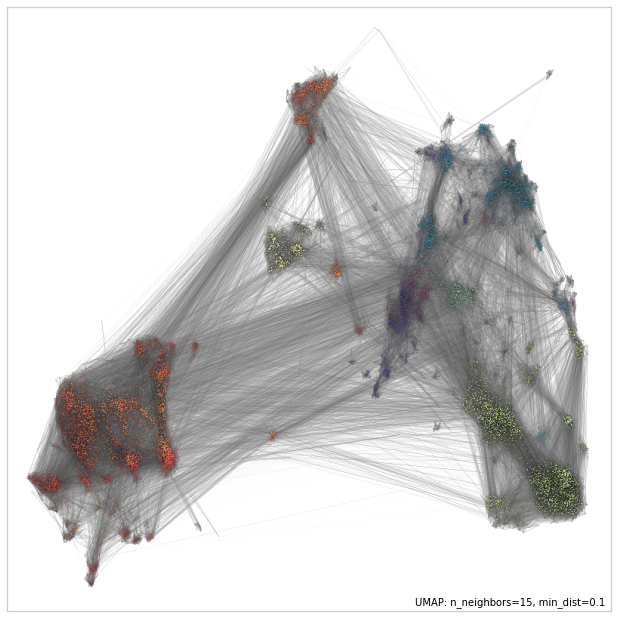

In [ ]:
umap.plot.connectivity(embedder, show_points=True, labels=y_train, cmap='viridis')

In [ ]:
%%time
val_emb = embedder.transform(X_test)


CPU times: user 178 ms, sys: 6.14 ms, total: 185 ms
Wall time: 265 ms


Text(0.5, 1.0, 'X_test')

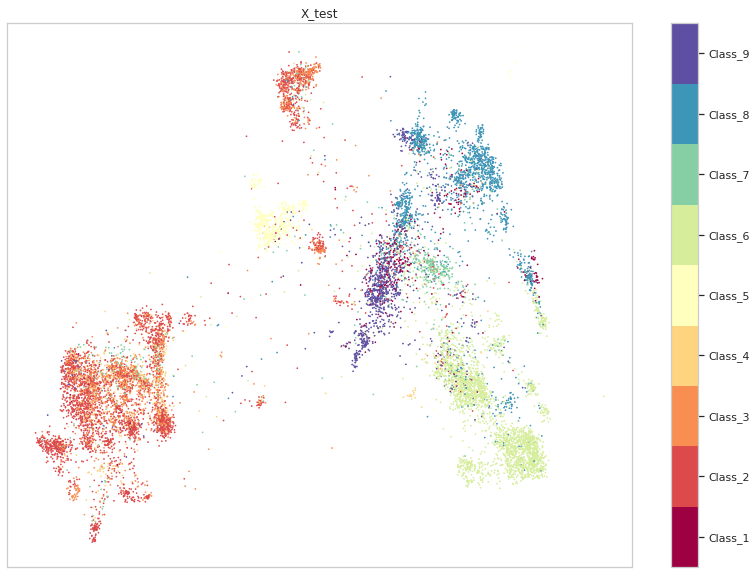

In [ ]:
fig, ax = plt.subplots(1, figsize=(14, 10))
plt.scatter(*val_emb.T, s=0.5, c=y_test, cmap='Spectral', alpha=1.0)
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(10)-0.5)
cbar.set_ticks(np.arange(9))
cbar.set_ticklabels(classes)
plt.title('X_test')

In [ ]:
%%time
test_emb = embedder.transform(test_pt_new)

CPU times: user 877 ms, sys: 89.9 ms, total: 967 ms
Wall time: 1.11 s


Text(0.5, 1.0, 'test')

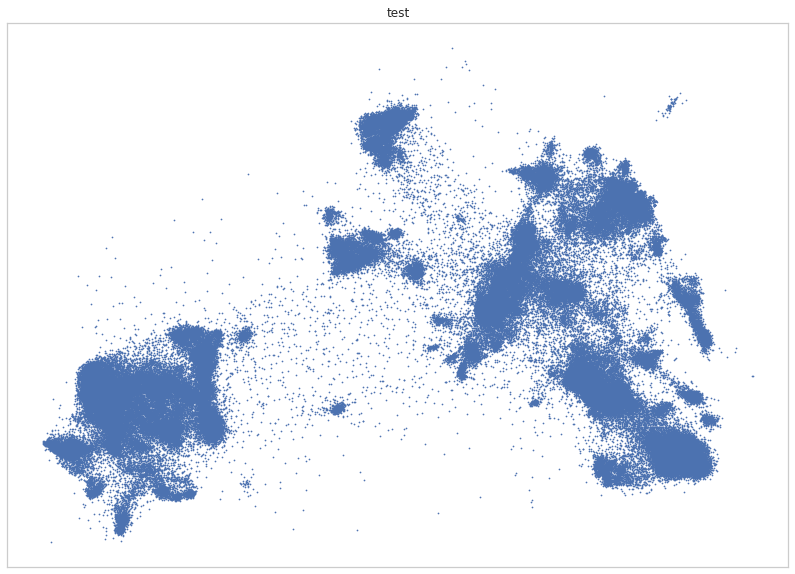

In [ ]:
fig, ax = plt.subplots(1, figsize=(14, 10))
plt.scatter(*test_emb.T, s=0.5, cmap='Spectral', alpha=1.0)
plt.setp(ax, xticks=[], yticks=[])
cbar.set_ticks(np.arange(9))
plt.title('test')

#K-neighbors


In [ ]:
#определим сумму расстояний до 5 ближайших соседей
neigh = NearestNeighbors(n_neighbors=5, n_jobs=-1)

neigh.fit(X_train)
dist_train_5, ind = neigh.kneighbors(X_train)

distances_neigh_5= [dist_train_5[i].sum() for i in range(len(dist_train_5))]

#определим сумму расстояний до 3 ближайших соседей
neigh = NearestNeighbors(n_neighbors=3, n_jobs=-1)

neigh.fit(X_train)
dist_train_3, ind = neigh.kneighbors(X_train)

distances_neigh_3= [dist_train_3[i].sum() for i in range(len(dist_train_3))]

#определим сумму расстояний до 1 ближайших соседей
neigh = NearestNeighbors(n_neighbors=1, n_jobs=-1)

neigh.fit(X_train)
dist_train_1, ind = neigh.kneighbors(X_train)

distances_neigh_1= [dist_train_1[i].sum() for i in range(len(dist_train_1))]

#добавим расстояния в трейн как новые признаки
X_train['dist_neigh_5'] = distances_neigh_5
X_train['dist_neigh_3'] = distances_neigh_3
X_train['dist_neigh_1'] = distances_neigh_1


#сделаем тоже самое для тестового датасета
#определим сумму расстояний до 5 ближайших соседей
neigh = NearestNeighbors(n_neighbors=5, n_jobs=-1)

neigh.fit(X_test)
dist_test_5, ind = neigh.kneighbors(X_test)

distances_neigh_5_test= [dist_test_5[i].sum() for i in range(len(dist_test_5))]

#определим сумму расстояний до 3 ближайших соседей
neigh = NearestNeighbors(n_neighbors=3, n_jobs=-1)

neigh.fit(X_test)
dist_test_3, ind = neigh.kneighbors(X_test)

distances_neigh_3_test= [dist_test_3[i].sum() for i in range(len(dist_test_3))]

#определим сумму расстояний до 1 ближайших соседей
neigh = NearestNeighbors(n_neighbors=1, n_jobs=-1)

neigh.fit(X_test)
dist_test_1, ind = neigh.kneighbors(X_test)

distances_neigh_1_test= [dist_test_1[i].sum() for i in range(len(dist_test_1))]

#добавим расстояния в тест как новые признаки
X_test['dist_neigh_5'] = distances_neigh_5_test
X_test['dist_neigh_3'] = distances_neigh_3_test
X_test['dist_neigh_1'] = distances_neigh_1_test

##Catboost


In [ ]:
cb_clf =  CatBoostClassifier(auto_class_weights = 'SqrtBalanced',
                             n_estimators = 1800,
                             depth = 8,
                             random_state=9)

cb_clf.fit(X_train, y_train, verbose=True)

y_pred = cb_clf.predict_proba(X_test)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo')
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

Learning rate set to 0.058755
0:	learn: 2.0607361	total: 838ms	remaining: 25m 8s
1:	learn: 1.9594641	total: 1.59s	remaining: 23m 46s
2:	learn: 1.8779875	total: 2.31s	remaining: 23m 6s
3:	learn: 1.8149145	total: 3.06s	remaining: 22m 53s
4:	learn: 1.7568497	total: 3.78s	remaining: 22m 36s
5:	learn: 1.7051480	total: 4.51s	remaining: 22m 29s
6:	learn: 1.6617241	total: 5.24s	remaining: 22m 23s
7:	learn: 1.6222685	total: 5.96s	remaining: 22m 15s
8:	learn: 1.5836995	total: 6.71s	remaining: 22m 15s
9:	learn: 1.5508701	total: 7.45s	remaining: 22m 13s
10:	learn: 1.5178461	total: 8.18s	remaining: 22m 10s
11:	learn: 1.4813914	total: 8.91s	remaining: 22m 7s
12:	learn: 1.4502856	total: 9.64s	remaining: 22m 5s
13:	learn: 1.4220897	total: 10.4s	remaining: 22m 4s
14:	learn: 1.3959294	total: 11.1s	remaining: 22m 2s
15:	learn: 1.3721431	total: 11.8s	remaining: 22m
16:	learn: 1.3450104	total: 12.6s	remaining: 21m 59s
17:	learn: 1.3246462	total: 13.3s	remaining: 21m 57s
18:	learn: 1.3043261	total: 14.1s	re

In [ ]:
y_pred1 = cb_clf.predict(X_test)
print(f1_score(y_test, y_pred1, average='weighted'))

0.8173039434458762


Text(0.5, 1.0, 'Confusion matrix Catboost')

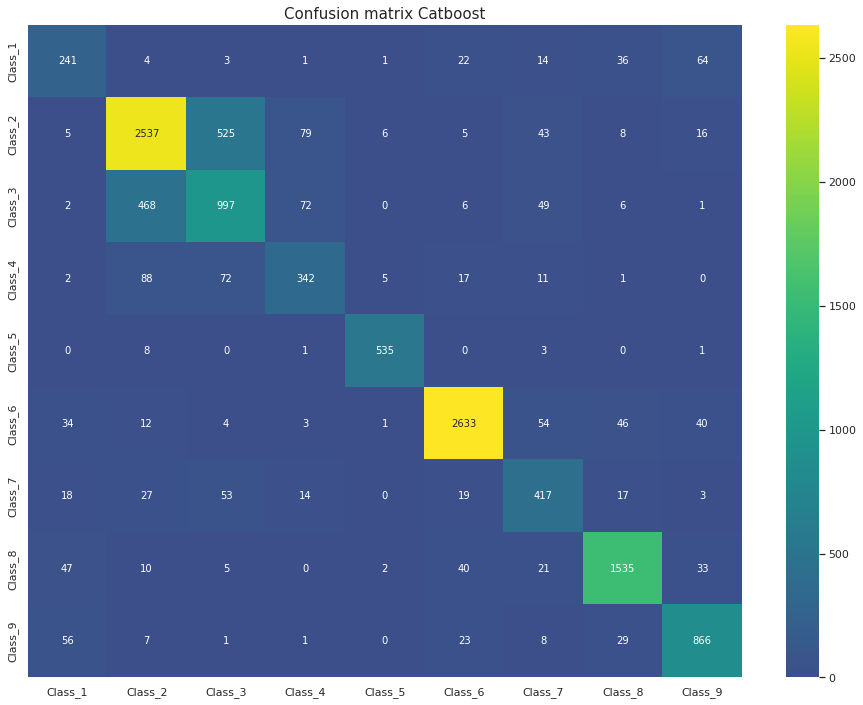

In [ ]:
confusion_matrix(y_test, y_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8])

plt.figure(figsize=(16,12))
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=classes, yticklabels=classes, center= 900)
plt.title('Confusion matrix Catboost', fontsize=15)

##LightGBM

In [ ]:
lg_clf = LGBMClassifier(objective = 'multiclass',
                        class_weight = 'balanced',
                        n_estimators = 1000,
                        random_state=9)

lg_clf.fit(X_train_1, y_train, verbose=True)

y_pred = lg_clf.predict_proba(X_test_1)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo')
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

log_loss=0.5138075868047199 roc_auc_score=0.975610408784919 


In [ ]:
y_pred1 = lg_clf.predict(X_test_1)
print(f1_score(y_test, y_pred1, average='weighted'))

0.8181176690263963


Text(0.5, 1.0, 'Confusion matrix LightGBM')

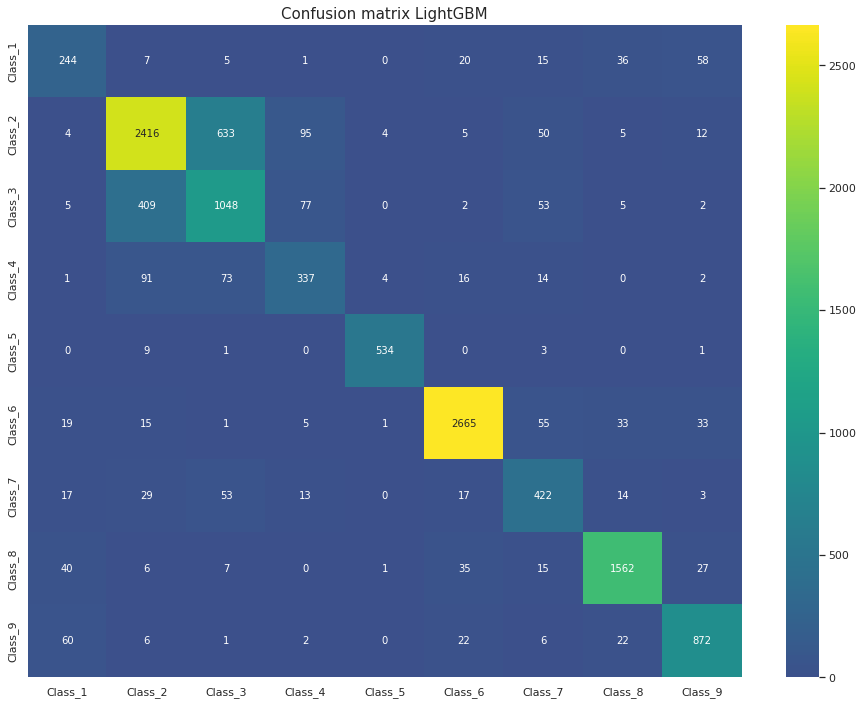

In [ ]:
confusion_matrix(y_test, y_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8])

plt.figure(figsize=(16,12))
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=classes, yticklabels=classes, center= 900)
plt.title('Confusion matrix LightGBM', fontsize=15)

##Random Forest

In [ ]:
rf_clf = RandomForestClassifier(class_weight = 'balanced',
                                n_estimators = 1000,
                                random_state=9)

rf_clf.fit(X_train_1, y_train)

y_pred = rf_clf.predict_proba(X_test_1)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo')
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

log_loss=0.5958559006183308 roc_auc_score=0.9735174554883547 


In [ ]:
y_pred1 = rf_clf.predict(X_test_1)
print(f1_score(y_test, y_pred1, average='weighted'))

0.796677761453868


Text(0.5, 1.0, 'Confusion matrix LightGBM')

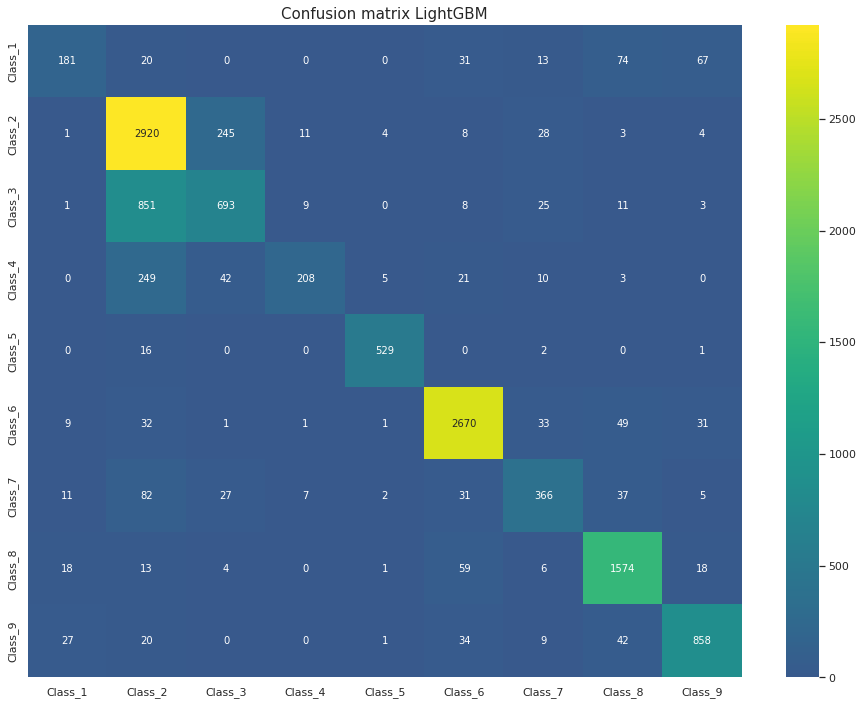

In [ ]:
confusion_matrix(y_test, y_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8])

plt.figure(figsize=(16,12))
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=classes, yticklabels=classes, center= 900)
plt.title('Confusion matrix LightGBM', fontsize=15)

##HistGradientBoostingClassifier

In [ ]:
model = HistGradientBoostingClassifier(loss = 'categorical_crossentropy', max_iter=500, learning_rate=0.03, verbose=1, l2_regularization=3)
model.fit(X_train, y_train)

y_pred = model.predict_proba(X_test)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo')
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

y_pred1 = model.predict(X_test)
print(f1_score(y_test, y_pred1, average='weighted'))

Binning 0.036 GB of training data: 0.478 s
Binning 0.004 GB of validation data: 0.014 s
Fitting gradient boosted rounds:
[1/500] 9 trees, 279 leaves (31 on avg), max depth = 12, train loss: 1.82935, val loss: 1.83334, in 0.390s
[2/500] 9 trees, 279 leaves (31 on avg), max depth = 12, train loss: 1.73435, val loss: 1.74123, in 0.361s
[3/500] 9 trees, 279 leaves (31 on avg), max depth = 11, train loss: 1.65382, val loss: 1.66361, in 0.369s
[4/500] 9 trees, 279 leaves (31 on avg), max depth = 11, train loss: 1.58352, val loss: 1.59575, in 0.365s
[5/500] 9 trees, 279 leaves (31 on avg), max depth = 11, train loss: 1.52090, val loss: 1.53492, in 0.353s
[6/500] 9 trees, 279 leaves (31 on avg), max depth = 11, train loss: 1.46440, val loss: 1.48044, in 0.371s
[7/500] 9 trees, 279 leaves (31 on avg), max depth = 11, train loss: 1.41295, val loss: 1.43074, in 0.358s
[8/500] 9 trees, 279 leaves (31 on avg), max depth = 11, train loss: 1.36613, val loss: 1.38561, in 0.363s
[9/500] 9 trees, 279 le

Text(0.5, 1.0, 'Confusion matrix HistGradientBoosting')

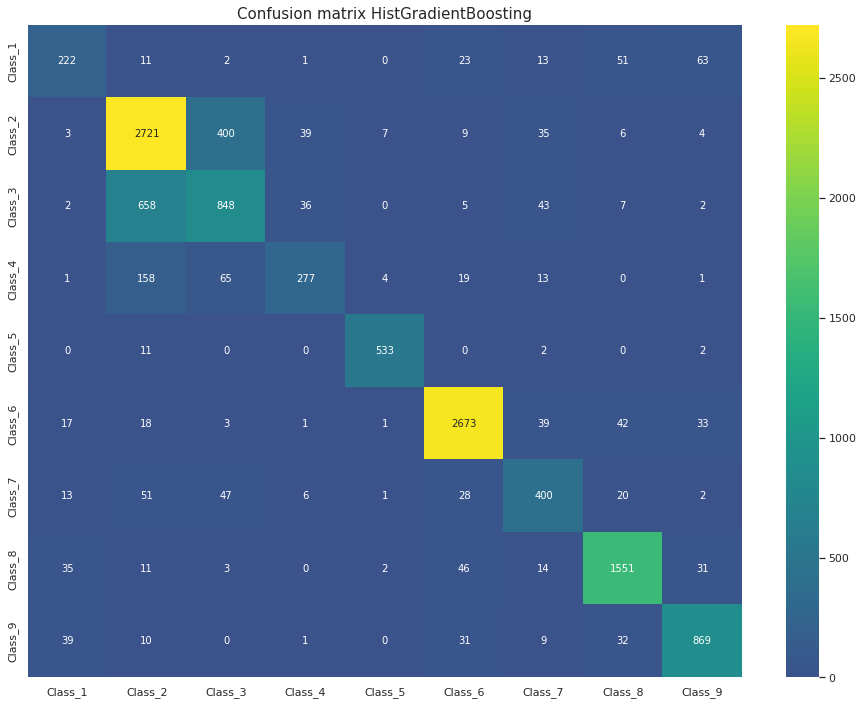

In [ ]:
confusion_matrix(y_test, y_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8])

plt.figure(figsize=(16,12))
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=classes, yticklabels=classes, center= 900)
plt.title('Confusion matrix HistGradientBoosting', fontsize=15)

#Выбор признаков

In [ ]:
feature_importance_cf = pd.DataFrame(cb_clf.feature_importances_, X_train.columns)

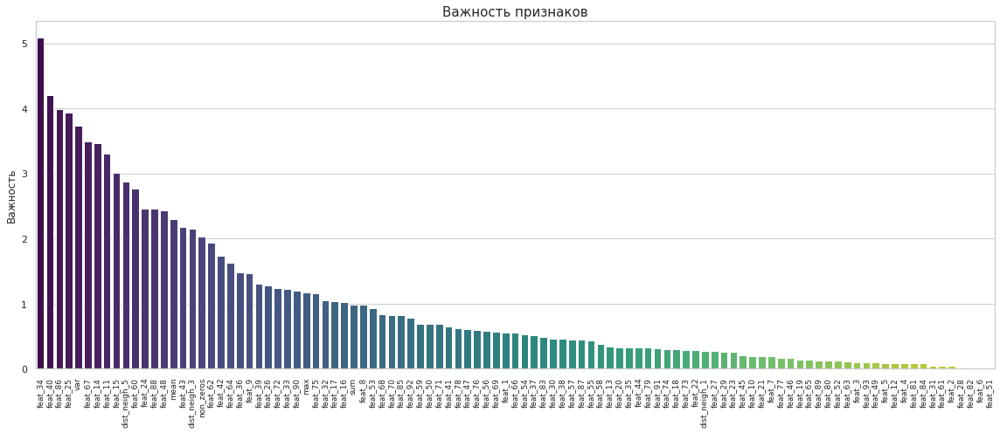

In [ ]:
fig, ax = plt.subplots(figsize=(16,7))
sns.barplot(feature_importance_cf.sort_values(by=0, ascending=False).index, feature_importance_cf[0].sort_values(ascending=False), palette='viridis')
plt.title('Важность признаков', fontsize=15)
plt.ylabel('Важность')
plt.xticks(rotation='90', fontsize=9)
fig.tight_layout()

In [ ]:
X_train_important = X_train.drop(columns=['feat_51', 'feat_82', 'feat_6', 'feat_28'])
X_test_important = X_test.drop(columns=['feat_51', 'feat_82', 'feat_6', 'feat_28'])

##Catboost

In [ ]:
cb_clf =  CatBoostClassifier(auto_class_weights = 'SqrtBalanced',
                             n_estimators = 1800,
                             depth = 8,
                             random_state=9)

cb_clf.fit(X_train_important, y_train, verbose=True)

y_pred = cb_clf.predict_proba(X_test_important)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo')
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

Learning rate set to 0.058755
0:	learn: 2.0676423	total: 1.11s	remaining: 33m 11s
1:	learn: 1.9702469	total: 2.18s	remaining: 32m 39s
2:	learn: 1.8899967	total: 3.33s	remaining: 33m 16s
3:	learn: 1.8198206	total: 4.4s	remaining: 32m 55s
4:	learn: 1.7587756	total: 5.54s	remaining: 33m 8s
5:	learn: 1.7075409	total: 6.62s	remaining: 32m 59s
6:	learn: 1.6603172	total: 7.72s	remaining: 32m 58s
7:	learn: 1.6192164	total: 8.8s	remaining: 32m 50s
8:	learn: 1.5828959	total: 9.85s	remaining: 32m 39s
9:	learn: 1.5443366	total: 10.9s	remaining: 32m 34s
10:	learn: 1.5102906	total: 12s	remaining: 32m 35s
11:	learn: 1.4789835	total: 13.2s	remaining: 32m 40s
12:	learn: 1.4535220	total: 14.3s	remaining: 32m 49s
13:	learn: 1.4263766	total: 15.5s	remaining: 32m 57s
14:	learn: 1.3996236	total: 16.6s	remaining: 32m 52s
15:	learn: 1.3744642	total: 17.7s	remaining: 32m 52s
16:	learn: 1.3463923	total: 18.8s	remaining: 32m 47s
17:	learn: 1.3226123	total: 19.8s	remaining: 32m 42s
18:	learn: 1.3022443	total: 20.

In [ ]:
y_pred1 = cb_clf.predict(X_test)
print(f1_score(y_test, y_pred1, average='weighted'))

0.8189736324156197


Text(0.5, 1.0, 'Confusion matrix Catboost')

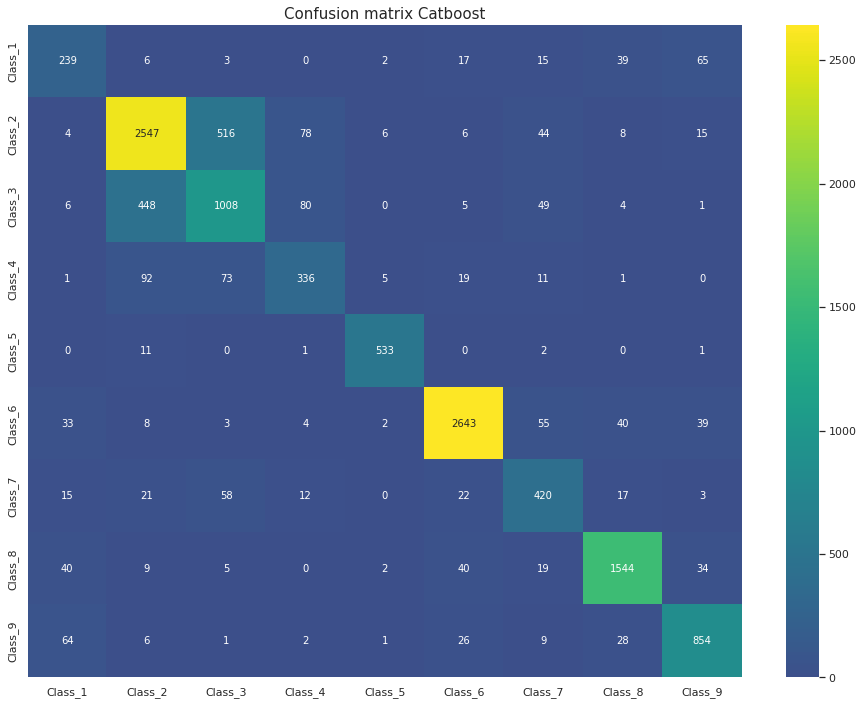

In [ ]:
confusion_matrix(y_test, y_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8])

plt.figure(figsize=(16,12))
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=classes, yticklabels=classes, center= 900)
plt.title('Confusion matrix Catboost', fontsize=15)

##HistGradientBoostingClassifier

In [ ]:
model = HistGradientBoostingClassifier(loss = 'categorical_crossentropy', max_iter=500, learning_rate=0.03, verbose=1, l2_regularization=3, max_depth=9)
model.fit(X_train_important, y_train)

y_pred = model.predict_proba(X_test_important)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo')
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

y_pred1 = model.predict(X_test_important)
print(f1_score(y_test, y_pred1, average='weighted'))

Binning 0.035 GB of training data: 0.978 s
Binning 0.004 GB of validation data: 0.031 s
Fitting gradient boosted rounds:
[1/500] 9 trees, 279 leaves (31 on avg), max depth = 9, train loss: 1.83017, val loss: 1.83010, in 0.978s
[2/500] 9 trees, 279 leaves (31 on avg), max depth = 9, train loss: 1.73589, val loss: 1.73647, in 0.828s
[3/500] 9 trees, 279 leaves (31 on avg), max depth = 9, train loss: 1.65604, val loss: 1.65754, in 1.168s
[4/500] 9 trees, 279 leaves (31 on avg), max depth = 9, train loss: 1.58581, val loss: 1.58909, in 0.794s
[5/500] 9 trees, 279 leaves (31 on avg), max depth = 9, train loss: 1.52317, val loss: 1.52785, in 0.975s
[6/500] 9 trees, 279 leaves (31 on avg), max depth = 9, train loss: 1.46675, val loss: 1.47246, in 0.916s
[7/500] 9 trees, 279 leaves (31 on avg), max depth = 9, train loss: 1.41567, val loss: 1.42270, in 1.001s
[8/500] 9 trees, 279 leaves (31 on avg), max depth = 9, train loss: 1.36898, val loss: 1.37737, in 0.926s
[9/500] 9 trees, 279 leaves (31

Text(0.5, 1.0, 'Confusion matrix LightGBM')

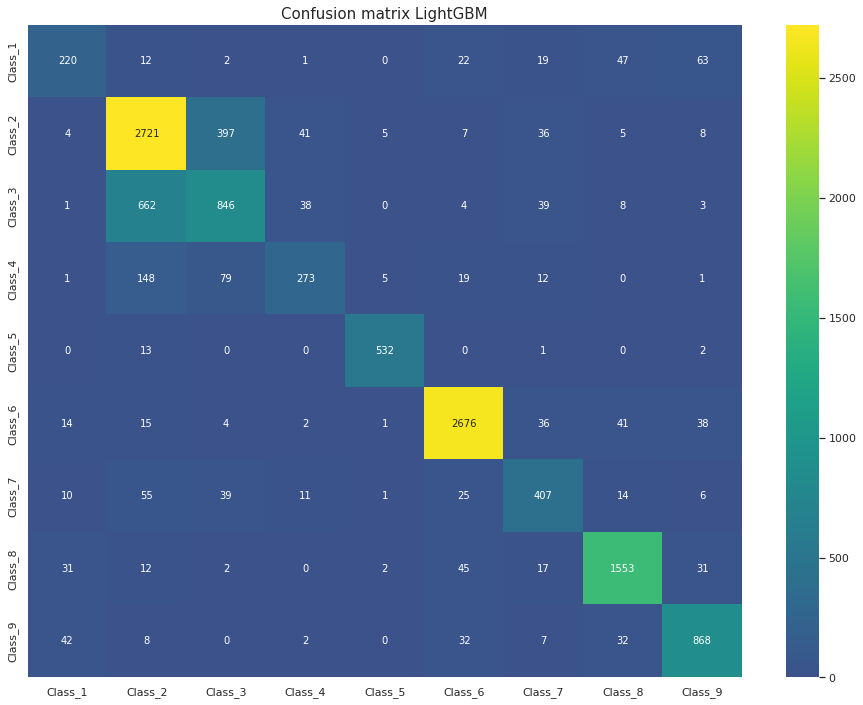

In [ ]:
confusion_matrix(y_test, y_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8])

plt.figure(figsize=(16,12))
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=classes, yticklabels=classes, center= 900)
plt.title('Confusion matrix LightGBM', fontsize=15)

#Model tuning

Лучший результат показала модель Catboost с добавлением фичей (без k-neighbors).

In [ ]:
X_train = X_train.drop(columns=['dist_neigh_5', 'dist_neigh_3', 'dist_neigh_1'], inplace=True)
X_test = X_test.drop(columns=['dist_neigh_5', 'dist_neigh_3', 'dist_neigh_1'], inplace=True)

In [ ]:
scoring = {'log_loss': make_scorer(log_loss),
           'F1-score': make_scorer(f1_score)}

parameters = {
               'l2_leaf_reg': [2, 5],
               'penalties_coefficient': [1, 3],
               }

clf = GridSearchCV(CatBoostClassifier(auto_class_weights = 'SqrtBalanced', n_estimators=1800, max_depth=8), parameters,scoring=scoring, refit=False, cv=3, n_jobs=-1, verbose=1)

clf.fit(X_train, y_train)

df=pd.DataFrame.from_dict(clf.cv_results_)
df

In [ ]:
column = df['mean_test_log_loss']
max_index = column.idxmax()
best_params = df.loc[max_index].params
best_params

In [ ]:
model = GradientBoostingClassifier(**best_params)
model.fit(X_train, y_train)

y_pred = model.predict_proba(X_test)
loss = log_loss(y_test, y_pred)
roc_auc = roc_auc_score( y_test, y_pred, average='weighted', multi_class='ovo') 
print('log_loss={} roc_auc_score={} '.format(loss, roc_auc))

In [ ]:
y_pred1 = model.predict(X_test)
print(f1_score(y_test, y_pred1, average='weighted'))

In [ ]:
confusion_matrix(y_test, y_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8])

plt.figure(figsize=(16,12))
cm = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=classes, yticklabels=classes, center= 900)
plt.title('Confusion matrix Catboost', fontsize=15)

#Submission

In [ ]:
cb_clf =  CatBoostClassifier(auto_class_weights = 'SqrtBalanced',
                             n_estimators = 1800,
                             depth = 8,
                             random_state=9)

cb_clf.fit(X_train, y_train, verbose=True)

y_sub = cb_clf.predict_proba(test_pt_new)

Learning rate set to 0.058755
0:	learn: 2.0653373	total: 1.22s	remaining: 36m 32s
1:	learn: 1.9661337	total: 2.37s	remaining: 35m 26s
2:	learn: 1.8866260	total: 3.41s	remaining: 34m 3s
3:	learn: 1.8206491	total: 4.62s	remaining: 34m 35s
4:	learn: 1.7607077	total: 6.05s	remaining: 36m 13s
5:	learn: 1.7097750	total: 7.48s	remaining: 37m 17s
6:	learn: 1.6683127	total: 8.88s	remaining: 37m 53s
7:	learn: 1.6257622	total: 10.3s	remaining: 38m 28s
8:	learn: 1.5830542	total: 11.5s	remaining: 37m 59s
9:	learn: 1.5477745	total: 12.5s	remaining: 37m 21s
10:	learn: 1.5125054	total: 13.5s	remaining: 36m 41s
11:	learn: 1.4805290	total: 14.7s	remaining: 36m 26s
12:	learn: 1.4537676	total: 15.7s	remaining: 36m 2s
13:	learn: 1.4247120	total: 16.8s	remaining: 35m 45s
14:	learn: 1.3944602	total: 17.9s	remaining: 35m 29s
15:	learn: 1.3729972	total: 19s	remaining: 35m 22s
16:	learn: 1.3473473	total: 20.1s	remaining: 35m 9s
17:	learn: 1.3255792	total: 21.2s	remaining: 34m 59s
18:	learn: 1.3066227	total: 22.

In [ ]:
# SUBMISSION
submission = pd.DataFrame(columns=['id'], data=sub)
submission = pd.concat([submission, pd.DataFrame(y_sub, columns=['Class_1', 'Class_2', 'Class_3', 'Class_4', 'Class_5', 'Class_6', 'Class_7', 'Class_8', 'Class_9'])], axis=1)

In [ ]:
# save submission file
submission.to_csv("kaggle_submission.csv", index=False)